In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import sys

sys.path.append(os.path.expanduser("~/clef/plantclef-2025/"))

In [3]:
from plantclef.spark import get_spark

spark = get_spark()
display(spark)

Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
25/02/23 14:11:49 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
25/02/23 14:11:49 WARN SparkConf: Note that spark.local.dir will be overridden by the value set by the cluster manager (via SPARK_LOCAL_DIRS in mesos/standalone/kubernetes and LOCAL_DIRS in YARN).


In [4]:
from pathlib import Path

home = Path.home()
train_embeddings_folder = home / "shared/plantclef/data/embeddings/train_embeddings/data"
emb_df = spark.read.parquet(str(train_embeddings_folder))

In [5]:
emb_df.printSchema()
emb_df.show(5)

root
 |-- image_name: string (nullable = true)
 |-- species_id: integer (nullable = true)
 |-- cls_embedding: array (nullable = true)
 |    |-- element: float (containsNull = true)
 |-- sample_id: integer (nullable = true)



+--------------------+----------+--------------------+---------+
|          image_name|species_id|       cls_embedding|sample_id|
+--------------------+----------+--------------------+---------+
|3a2c58a78ee93b471...|   1363472|[0.9020945, 0.016...|       15|
|0a0bf86d70307e8db...|   1361957|[-0.26025677, -0....|       15|
|7990901729be71186...|   1363472|[-0.1633016, -0.0...|       15|
|80257a4818f5955f9...|   1392612|[-0.7547744, 0.39...|       15|
|e13e476d0dc36ed7b...|   1360562|[0.14017674, 0.05...|       15|
+--------------------+----------+--------------------+---------+
only showing top 5 rows



In [6]:
train_data_folder = home / "shared/plantclef/data/parquet/train"
train_data_df = spark.read.parquet(str(train_data_folder))

In [7]:
train_data_df.printSchema()
train_data_df.show(5)

root
 |-- image_name: string (nullable = true)
 |-- path: string (nullable = true)
 |-- data: binary (nullable = true)
 |-- organ: string (nullable = true)
 |-- species_id: integer (nullable = true)
 |-- obs_id: long (nullable = true)
 |-- license: string (nullable = true)
 |-- partner: string (nullable = true)
 |-- author: string (nullable = true)
 |-- altitude: double (nullable = true)
 |-- latitude: double (nullable = true)
 |-- longitude: double (nullable = true)
 |-- gbif_species_id: string (nullable = true)
 |-- species: string (nullable = true)
 |-- genus: string (nullable = true)
 |-- family: string (nullable = true)
 |-- dataset: string (nullable = true)
 |-- publisher: string (nullable = true)
 |-- references: string (nullable = true)
 |-- url: string (nullable = true)
 |-- learn_tag: string (nullable = true)
 |-- image_backup_url: string (nullable = true)



+--------------------+--------------------+--------------------+-----+----------+----------+--------------------+-------+----------------+--------+-----------------+------------------+---------------+--------------------+-------------+----------+--------+-----------+--------------------+--------------------+---------+--------------------+
|          image_name|                path|                data|organ|species_id|    obs_id|             license|partner|          author|altitude|         latitude|         longitude|gbif_species_id|             species|        genus|    family| dataset|  publisher|          references|                 url|learn_tag|    image_backup_url|
+--------------------+--------------------+--------------------+-----+----------+----------+--------------------+-------+----------------+--------+-----------------+------------------+---------------+--------------------+-------------+----------+--------+-----------+--------------------+--------------------+---------

In [10]:
id_map_path = home / "scratch/plantclef/data/faiss/id_map"
id_df = spark.read.parquet(str(id_map_path))

In [11]:
id_df.printSchema()
id_df.show(5)

root
 |-- id: integer (nullable = true)
 |-- image_name: string (nullable = true)
 |-- species_id: integer (nullable = true)

+---+--------------------+----------+
| id|          image_name|species_id|
+---+--------------------+----------+
|  0|3a2c58a78ee93b471...|   1363472|
|  1|0a0bf86d70307e8db...|   1361957|
|  2|7990901729be71186...|   1363472|
|  3|80257a4818f5955f9...|   1392612|
|  4|e13e476d0dc36ed7b...|   1360562|
+---+--------------------+----------+
only showing top 5 rows



In [12]:
sample_df = (
    id_df
    .filter(id_df.id < 10) \
    .join(emb_df, "image_name", "inner") \
    .join(train_data_df, "image_name", "inner") \
    .select(
        id_df["id"],
        emb_df["cls_embedding"],
        train_data_df["path"],
    )
)
sample_df.show()

+---+--------------------+--------------------+
| id|       cls_embedding|                path|
+---+--------------------+--------------------+
|  6|[0.7085954, 1.002...|/PlantCLEF2024/tr...|
|  2|[-0.1633016, -0.0...|/PlantCLEF2024/tr...|
|  0|[0.9020945, 0.016...|/PlantCLEF2024/tr...|
|  5|[0.07666576, 1.38...|/PlantCLEF2024/tr...|
|  3|[-0.7547744, 0.39...|/PlantCLEF2024/tr...|
|  7|[0.35157233, 0.92...|/PlantCLEF2024/tr...|
|  4|[0.14017674, 0.05...|/PlantCLEF2024/tr...|
|  8|[1.2980891, -1.23...|/PlantCLEF2024/tr...|
|  1|[-0.26025677, -0....|/PlantCLEF2024/tr...|
|  9|[0.8309413, 0.999...|/PlantCLEF2024/tr...|
+---+--------------------+--------------------+



In [13]:
import numpy as np
import faiss

In [42]:
sample_pd = sample_df.toPandas().sort_values("id")
embeddings = np.stack(sample_pd["cls_embedding"].values).astype("float32")
embeddings.shape

(10, 768)

In [15]:
index_path = home / f"scratch/plantclef/data/faiss/train_embeddings.index"
index = faiss.read_index(str(index_path))

In [16]:
import time

def search(index, queries, top_k):
    t0 = time.time()
    faiss.normalize_L2(queries)
    d, i = index.search(queries, top_k)
    print(f"Found {top_k} nearest neighbors for {queries.shape[0]} queries in {time.time() - t0:.2f} seconds")
    return d, i

In [43]:
d, i = search(index, embeddings[:10], 5)
print(d)
print(i)

Found 5 nearest neighbors for 10 queries in 1.64 seconds
[[0.         0.79556966 0.8011354  0.8255063  0.82876563]
 [0.         0.6387692  0.654473   0.6779758  0.68311745]
 [0.         0.7348903  0.75639284 0.763025   0.786746  ]
 [0.         0.70972085 0.7411541  0.7417434  0.75901157]
 [0.         0.32535285 0.41609356 0.43117273 0.43273944]
 [0.         0.2706439  0.55746335 0.576292   0.57877237]
 [0.         0.6280755  0.6592169  0.69121975 0.71135   ]
 [0.         0.252515   0.27580565 0.27751392 0.291685  ]
 [0.         0.84208876 0.8923166  0.95695996 0.9684109 ]
 [0.         0.39451292 0.4745834  0.49562874 0.536248  ]]
[[      0 1008262  263901 1373569  399525]
 [      1  465881  103813 1140298  709127]
 [      2 1370109  863678  210267  214171]
 [      3  426953  203505   17979  341870]
 [      4  691169  188919 1359724  114516]
 [      5 1084362  192849  352568  327764]
 [      6 1376664  923293 1315426 1028011]
 [      7 1262428  786460  114519  796996]
 [      8  638755 

In [44]:
ids = np.unique(i).tolist()
plot_df = (
    id_df
    .filter(id_df.id.isin(ids))
    .join(train_data_df, "image_name", "inner") \
    .select(
        id_df["id"],
        train_data_df["species"],
        train_data_df["path"],
    )
)
plot_df.show()

+-------+--------------------+--------------------+
|     id|             species|                path|
+-------+--------------------+--------------------+
|1045448|Rubus scissus W.C...|/PlantCLEF2024/tr...|
| 292299|Foeniculum vulgar...|/PlantCLEF2024/va...|
|      9|Foeniculum vulgar...|/PlantCLEF2024/tr...|
| 652843|Foeniculum vulgar...|/PlantCLEF2024/tr...|
| 441124|Foeniculum vulgar...|/PlantCLEF2024/tr...|
| 986370|Foeniculum vulgar...|/PlantCLEF2024/tr...|
| 586081|Rubus integribasi...|/PlantCLEF2024/tr...|
|1315426|     Ribes rubrum L.|/PlantCLEF2024/tr...|
|1008262|    Poa palustris L.|/PlantCLEF2024/tr...|
| 399525|    Poa palustris L.|/PlantCLEF2024/tr...|
| 923293|     Ribes nigrum L.|/PlantCLEF2024/tr...|
| 796996|Tanacetum vulgare L.|/PlantCLEF2024/tr...|
|      5|Ranunculus arvens...|/PlantCLEF2024/tr...|
| 638755|Rubus bertramii G...|/PlantCLEF2024/tr...|
| 114516|Salpichroa origan...|/PlantCLEF2024/tr...|
|      4|Salpichroa origan...|/PlantCLEF2024/tr...|
|      6|   

In [33]:
plot_pd = plot_df.toPandas()

In [45]:
path_dict = plot_pd.set_index("id")["path"].to_dict()
species_dict = plot_pd.set_index("id")["species"].to_dict()

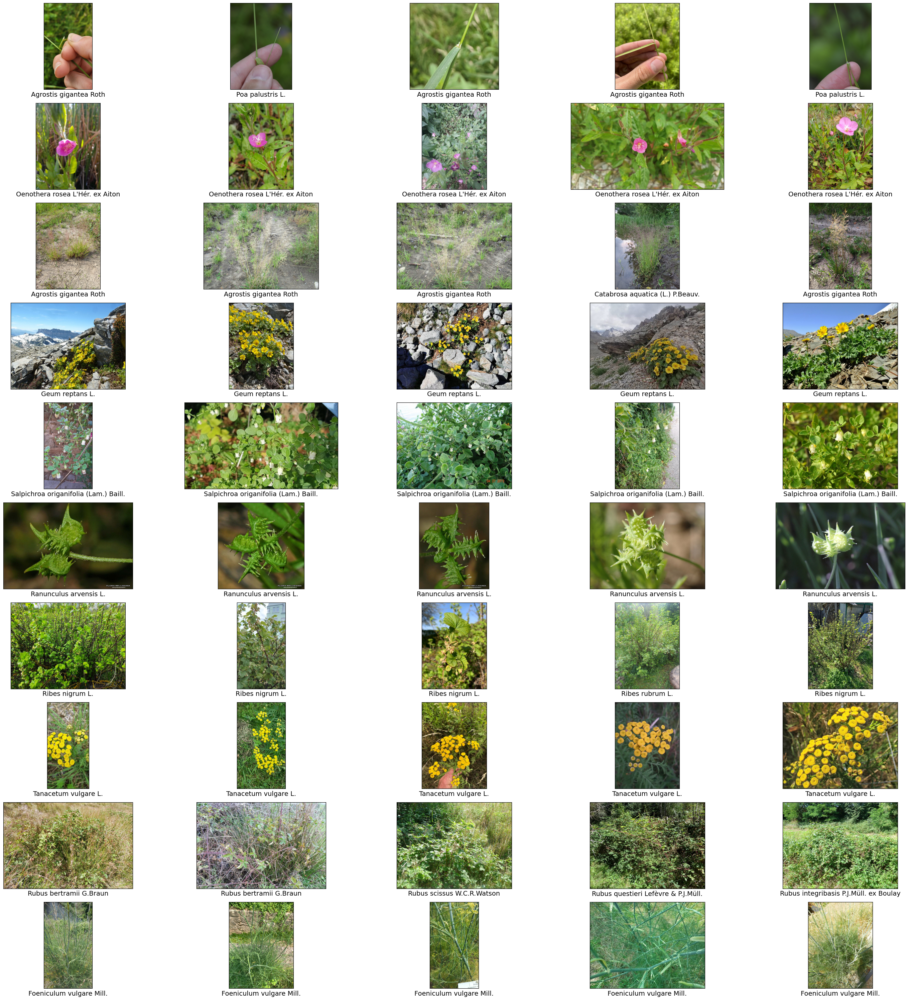

In [46]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

train_images_folder = str(Path.home() / "shared/plantclef/data/train")
fig, axes = plt.subplots(10, 5, figsize=(30, 30))

for row in range(10):
    for col in range(5):
        ax = axes[row, col]
        id = i[row, col]
        img_path = train_images_folder + path_dict[id]
        img = mpimg.imread(img_path)
        ax.imshow(img)
        
        ax.set_xlabel(species_dict[id])
        ax.xaxis.label.set_size(14)
        ax.set_xticks([])
        ax.set_yticks([])

plt.tight_layout()
plt.show()